## MAC0317/MAC5920
## Introdução ao Processamento de Sinais Digitais
### Seção 1.6: Amostragem e aliasing

In [1]:
import math as m
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.animation as anim
from IPython.display import HTML

### Dependência do sinal em relação à taxa de amostragem
### Figura 1.8: Exemplo simples de sinal 1D amostrado a 20Hz ($\Delta_t=0.05$)

$$f(t) = \sin(\omega t)$$

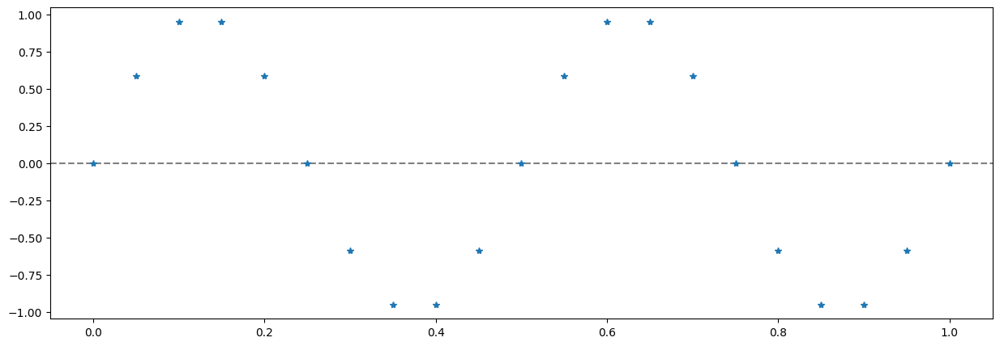

In [2]:
t = np.linspace(0,1,21)
x = np.sin(44*m.pi*t)
plt.figure(figsize=(15,5))
plt.axhline(y=0.0, color='gray', linestyle='--', ms=1)
plt.plot(t,x,"*")
plt.show()

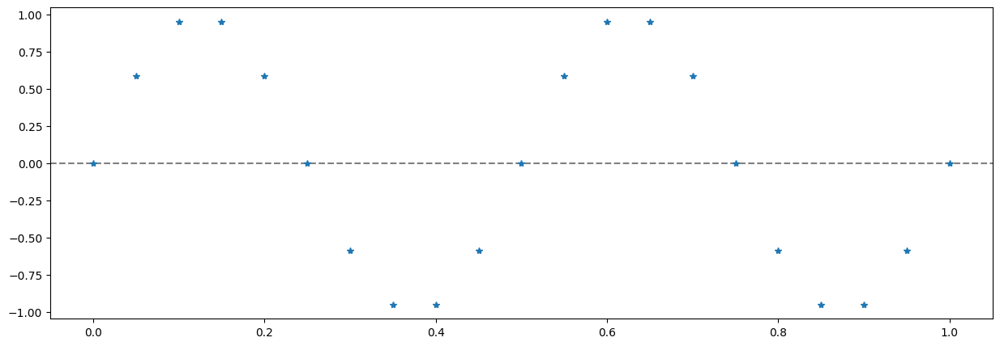

In [3]:
# experimento
# reescrevendo a mesma amostragem utilizando rate e arange (como nos outros lugares)
dur  = 1 + 1/20  # 1 segundo mais um intervalo, apenas para ficar igual ao gráfico anterior
rate = 20 # 20 Hz frequencia da amostrage, taxa de amostragem, sampling rate
t = np.arange(0, dur, 1/rate)

# reescrevendo a geração do sinal utilizando a notação de frequencia da forma de onda (q) ao invés da frequencia radial (w). 
q = 22 # 22 Hz (22 ciclos por segundo)

# sampled waveform of 22Hz with sampling rate 20hz
sampled = np.sin(2*m.pi*q*t)
plt.figure(figsize=(15,5))
plt.axhline(y=0.0, color='gray', linestyle='--', ms=1)
plt.plot(t,sampled,"*")
plt.show()

Nota: Reescrever o sinal e taxa de amostragem utilizando os mesmo termos, frequência, começa a me dar uma intuição sobre a relação entre elas.

Será que o autor do livro não queria que isso ficasse evidente de primeira? O livro me parece pouco claro as vezes, estou tentando me acostumar. 


Sabemos que existe aliasing/rebatimento e que a frequência aparente do sinal é 22(freq sinal) - 20(freq amost) = +2Hz é isso?

O sinal do resultado indica a fase que  sinal inicia.



### Figura 1.9: A mesma função anterior, amostrada a 200Hz ($\Delta_t=0.005$)

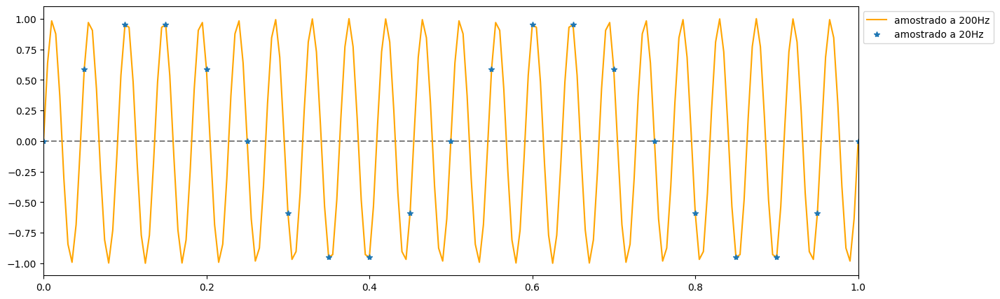

In [4]:
t = np.linspace(0,1,21)
x = np.sin(44*m.pi*t)
t2 = np.linspace(0,1,201)
x2 = np.sin(44*m.pi*t2)
plt.figure(figsize=(15,5))
plt.axhline(y=0.0, color='gray', linestyle='--', ms=1)
plt.plot(t2,x2, label='amostrado a 200Hz', color='orange')
plt.plot(t,x,"*", label='amostrado a 20Hz')
plt.xlim([0, 1])
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

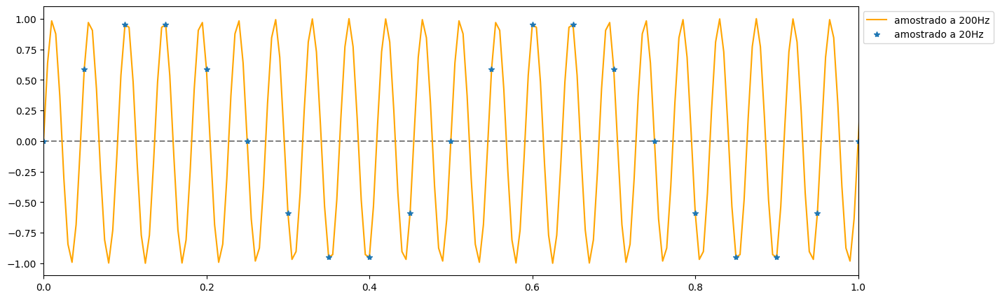

In [5]:
# reescrevendo as variáveis para deixar o código mais claro (pelo menos para mim).
duration = 1 + 1/20# o gráfico tem duração de um segundo + o mesmo teco do gráfico anterior

#Sinal gerado
def buildSignal(frequencia_em_hertz):
    return lambda intervalos_amostragem: np.sin(2*m.pi*frequencia_em_hertz*intervalos_amostragem)

q = 22 # 22 Hz
continuos_signal = buildSignal(frequencia_em_hertz=q)

# Primeira amostragem
sample_rate_1 = 20 # 20 Hz frequência de amostragem = taxa de amostragem = sampling rate. 20 amostras por segundo
sample_points_1 = np.arange(0, duration, 1/sample_rate_1)
sampled_signal_1 = continuos_signal(sample_points_1)

# Segunda amostragem
sample_rate_2 = 200 # 200 Hz frequência de amostragem = taxa de amostragem = sampling rate. 200 amostras por segundo
sample_points_2 = np.arange(0, duration, 1/sample_rate_2)
sampled_signal_2 = continuos_signal(sample_points_2)

plt.figure(figsize=(15,5))
plt.axhline(y=0.0, color='gray', linestyle='--', ms=1)
plt.plot(sample_points_2, sampled_signal_2, label='amostrado a 200Hz',  color='orange')
plt.plot(sample_points_1, sampled_signal_1, "*", label='amostrado a 20Hz')
plt.xlim([0, 1])
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

## Explicação: o fenômeno do rebatimento

**O problema:** existem infinitos valores de $f$ e $g$ tais que

$$\sin\left(2\pi f\frac{n}{R}\right) = \sin\left(2\pi g\frac{n}{R}\right), \forall n\in\mathbb{Z}.$$

Para essa condição valer, basta que os argumentos das senoides acima correspondam sempre a ângulos equivalentes. Isso ocorre quando para qualquer $n\in\mathbb{Z}$ existe algum $k\in\mathbb{Z}$ tal que

$$2\pi f\frac{n}{R} = 2\pi g\frac{n}{R} + k\cdot 2\pi.$$

A condição acima com $n=1$ equivale a

$$\exists k\in\mathbb{Z} : f-g = kR,$$

e essa condição é necessária e suficiente para as duas funções senoidais de frequências $f$ e $g$ amostradas a $R$ Hz coincidirem em todos os pontos.

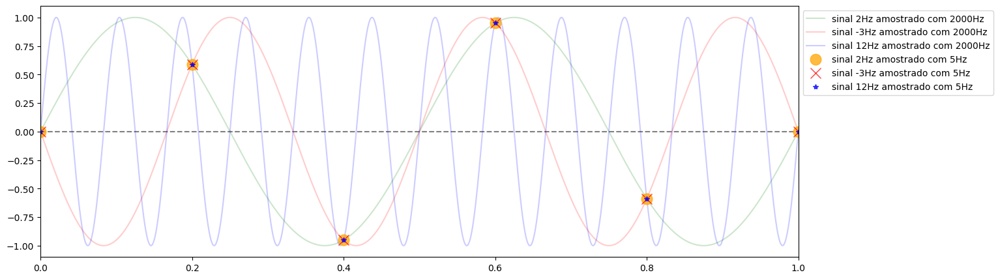

In [6]:
# experimento. nesse momento o enunciado anterior está um pouco diferente da ilustração anterior

sampling_rate = 5 # N = sample rate = frequencia de amostragem = taxa de amostragem = 20 Hz
signal_base_frequency = 3
f1 = 2
f2 = f1 + -1*sampling_rate # multiple of sampling rate
f3 = f1 + 2*sampling_rate  # multiple of sampling rate

continuos_signal_1 = buildSignal(f1)
continuos_signal_2 = buildSignal(f2)
continuos_signal_3 = buildSignal(f3)

# Definindo uma única amostragem perfeita para poder desenhar o sinal 'original'
duration = 2000
sample_rate_perfect = 2000 # 2000 Hz frequência de amostragem = taxa de amostragem = sampling rate. 2000 amostras por segundo
sampled_points_perfect = np.arange(0, duration, 1/sample_rate_perfect)
perfect_signal_1 = continuos_signal_1(sampled_points_perfect)
perfect_signal_2 = continuos_signal_2(sampled_points_perfect)
perfect_signal_3 = continuos_signal_3(sampled_points_perfect)
    
# Definindo amostragens para causar perda de informação
sample_points = np.arange(0, duration, 1/sampling_rate)
sample_signal_1 = continuos_signal_1(sample_points)
sample_signal_2 = continuos_signal_2(sample_points)
sample_signal_3 = continuos_signal_3(sample_points)

plt.figure(figsize=(15,5))
plt.axhline(y=0.0, color='gray', linestyle='--', ms=1)
plt.plot(sampled_points_perfect, perfect_signal_1, label=f'sinal {f1}Hz amostrado com {sample_rate_perfect}Hz',  color='green', alpha=0.2)
plt.plot(sampled_points_perfect, perfect_signal_2, label=f'sinal {f2}Hz amostrado com {sample_rate_perfect}Hz',  color='red', alpha=0.2)
plt.plot(sampled_points_perfect, perfect_signal_3, label=f'sinal {f3}Hz amostrado com {sample_rate_perfect}Hz',  color='blue', alpha=0.2)

plt.plot(sample_points, sample_signal_1, "o", label=f'sinal {f1}Hz amostrado com {sampling_rate}Hz',  color='orange', markersize=12, alpha=0.75)
plt.plot(sample_points, sample_signal_2, "x", label=f'sinal {f2}Hz amostrado com {sampling_rate}Hz',  color='red', markersize=12, alpha=0.75)
plt.plot(sample_points, sample_signal_3, "*", label=f'sinal {f3}Hz amostrado com {sampling_rate}Hz',  color='blue', markersize=6, alpha=0.75)

plt.xlim([0, 1])
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()


Nota: simplismente o que a relação q^ - q = mN diz é que uma amostragem 
    
    1. Amostragem gera perda de informação. De sinal analógico ou de uma forma de onda básica.
    2. Com formas de ondas básicas, sinais periódicos, podemos concluir que infinitos sinais com |frequencia| multiplo da amostragem geram sinais amostrados iguais. E que não conseguimos distinguir entre eles.
    3. Nesse arranjo, a maioria desses sinais estará sendo subamostrada.
    
 
 Duas implicações:
 
     1.FÍSICA: Se o sinal capturado consistir em suporposição de sinais com frequência multipla de frequêcia de amostragem (N, fs, taxa de amostragem) não será possível distinguir individualmente os sinais. Não conseguimos saber se é um, dois, três, infinitos sinais sobrepostos. A informação não suficiente e ponto final. A única exceção é se soubermos que o sinal a ser amostrado consiste apenas de formas de ondas em um intervalo específico de frequência. -N/2 < q <= N/2, isso remove os sinais com |frequência| mais alta. Essa é a razão de usaro filtros de passa baixa (low pass filter) antes da amostragem. Para remover as frequências maiores que N/2 = frequencia amostragem/2.
     
     2. MATEMÁTICA: É uma simplificação. Quando analisando sinais amostrados com frequencia de amostagem de N Hz só vamos precisar formas de ondas com q (frequência) no intervalo -N/2 < q <= N/2. Essa próxima sessão.


Nyquist Sampling criterion: Para evitar aliasing/rebatimento, precisamos amostrar com frequência o dobro da maior frequência presente no sinal.
Teorema da amostragem de Shannon: Diz que se o sinal conter apenas frequências no intervalo de 0 a N/2, a frequência de amostragem for N, então o sinal pode ser reconstruído perfeitamente.

A mesma condição vale para que dois cossenos de frequências $f$ e $g$ produzam a mesma lista de amostras, e analogamente para duas exponenciais complexas de frequências f e g:

$$\begin{array}{c}
e^{i2\pi f\frac{n}{R}} = e^{i2\pi g\frac{n}{R}}, \forall n\in\mathbb{Z}\\
\Updownarrow\\
e^{i2\pi (f-g)\frac{n}{R}}=1, \forall n\in\mathbb{Z}\\
\Updownarrow\\
\forall n\in\mathbb{Z}\quad\exists k\in\mathbb{Z}: 2\pi (f-g)\frac{n}{R} = k2\pi\\
\Updownarrow\\
\exists k\in\mathbb{Z}: f-g = kR
\end{array}
$$

Assim, ao utilizarmos uma taxa de amostragem R, todas as senoides e/ou exponenciais com frequências

$$g=\ldots,f-3R,f-2R,f-R,f,f+R,f+2R,f+3R\ldots$$

gerarão a mesma lista de amostras que aquela com frequência $f$.

### Aliasing traz duas implicações importantes:

> - implicação física/perceptual: ao se amostrar um sinal analógico com taxa de amostragem $R$, perde-se a capacidade de discernir frequências separadas por múltiplos de $R$, e em particular os valores que não estão na faixa $-\frac{R}{2}<f\le \frac{R}{2}$ serão representados incorretamente (rebatidos), correspondendo a alguma outra frequência (aparente) que pertence à faixa representável.

> - implicação matemática: para se analisar um sinal a $R$ Hz, basta considerar frequências na faixa $-\frac{R}{2}<f\le \frac{R}{2}$.

Essas implicações ilustram a condição de Shannon-Nyquist, que afirma que para representar corretamente componentes senoidais de até $F$ Hz é necessário utilizar uma taxa de amostragem $R\ge 2F$ Hz, e também explicam a necessidade de utilização de filtros passa-baixas na conversão analógico-digital.



### Figura 1.10: Exemplo de aliasing espacial. A mesma função 

$$f(x,y)=256\sin(2\pi(50x+70y))$$

### é amostrada em grids de 60x60, 100x100, 300x300 e 1000x1000

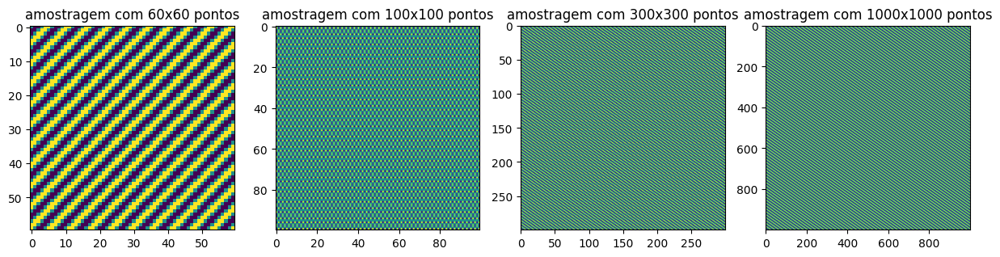

In [7]:
N=[60, 100, 300, 1000]
g, ax = plt.subplots(1,4,figsize=(15,4))
for j in range(4):
    R = N[j]
    x = np.arange(0,1,1/R)
    y = np.arange(1,0,-1/R)
    x, y = np.meshgrid(x,y)
    f = m.e ** (2 * m.pi * 1j * 70 * y) * m.e ** (2 * m.pi * 1j * 50 * x)
    ax[j].imshow(0.5*(f.imag)+1)
    ax[j].set_title("amostragem com {0}x{1} pontos".format(N[j],N[j]))
plt.show()

### Alternativa: mostra a variação do tamanho do grid de 10 em 10

In [10]:
%%capture
plt.ion()
fig = plt.figure(figsize=(10,10))
plt.gray()
density = 500
x = np.arange(0,1,1/density)
y = np.arange(0,1,1/density)
x, y = np.meshgrid(x,y)
ims = []
for N in np.arange(50,500,10):
    f = m.e**(2*m.pi*1j*70*np.round(y*N)/N)*m.e**(2*m.pi*1j*50*np.round(x*N)/N)
    im = plt.imshow(f.imag, origin='lower', cmap='gray', vmin=-1, vmax=1)
    plt.axis('off')
    ims.append([im])
    
imf = anim.ArtistAnimation(fig, ims, interval=250, blit=True)

In [11]:
HTML(imf.to_jshtml())